# Quickstart: NOAA GFS forecast and analysis, virtual - dynamical.org Icechunk Zarr

A brief introduction to the NOAA GFS forecast and analysis virtual datasets, transformed into an analysis-ready, cloud-optimized format by dynamical.org.

These virtual datasets include all the model runs, forecast steps, and vertical levels produced by GFS.

The two datasets here are optimized for spatial (map) access patterns. Use the time-optimized [NOAA GFS analysis](https://dynamical.org/catalog/noaa-gfs-analysis/) and [NOAA GFS forecast](https://dynamical.org/catalog/noaa-gfs-forecast/) for faster time-series access if you need only a portion of the world.

Dataset documentation:
- Forecast: https://dynamical.org/catalog/noaa-gfs-forecast-virtual/
- Analysis: https://dynamical.org/catalog/noaa-gfs-analysis-virtual/


In [ ]:
# If running locally, follow README.md for simple dependency installation.
# If using Google Colab, run this cell.
!uv pip install dynamical-catalog cartopy scipy

In [2]:
# TEMPORARY: these datasets are not in the dynamical.org catalog yet, so this cell opens their
# Icechunk stores directly. Once they are published, replace this whole cell with:
#
#     import dynamical_catalog
#
#     forecast = dynamical_catalog.open("noaa-gfs-forecast-virtual", chunks=None)
#     analysis = dynamical_catalog.open("noaa-gfs-analysis-virtual", chunks=None)
#     analysis_pressure = dynamical_catalog.open("noaa-gfs-analysis-virtual", group="pressure_level", chunks=None)
#     forecast
#
# And move the remaining required imports down to the top of the first cell they are needed
import cartopy.crs as ccrs
import icechunk
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr


def open_virtual(dataset_id, **kwargs):
    # Chunks reference NOAA's public GFS archive, which icechunk must be allowed to read anonymously.
    authorize = icechunk.containers_credentials(
        {"s3://noaa-gfs-bdp-pds/": icechunk.s3_anonymous_credentials()}
    )
    storage = icechunk.s3_storage(
        bucket="dynamical-noaa-gfs", prefix=f"{dataset_id}/v0.1.0.icechunk", region="us-west-2", anonymous=True
    )
    repo = icechunk.Repository.open(storage, authorize_virtual_chunk_access=authorize)
    return xr.open_zarr(repo.readonly_session("main").store, consolidated=False, **kwargs)


forecast = open_virtual("noaa-gfs-forecast-virtual", chunks=None)
analysis = open_virtual("noaa-gfs-analysis-virtual", chunks=None)
analysis_pressure = open_virtual("noaa-gfs-analysis-virtual", group="pressure_level", chunks=None)
forecast

<xarray.Dataset> Size: 3PB
Dimensions:                                                  (init_time: 7886,
                                                              lead_time: 209,
                                                              latitude: 721,
                                                              longitude: 1440)
Coordinates:
  * init_time                                                (init_time) datetime64[ns] 63kB ...
    expected_forecast_length                                 (init_time) timedelta64[us] 63kB ...
  * lead_time                                                (lead_time) timedelta64[us] 2kB ...
    valid_time                                               (init_time, lead_time) datetime64[ns] 13MB ...
  * latitude                                                 (latitude) float64 6kB ...
  * longitude                                                (longitude) float64 12kB ...
    spatial_ref                                              int64 8B ...
Data variables: (12/255)
    albedo_surface                                           (init_time, lead_time, latitude, longitude) float64 14TB ...
    average_low_cloud_cover                                  (init_time, lead_time, latitude, longitude) float64 14TB ...
    average_pressure_high_cloud_top                          (init_time, lead_time, latitude, longitude) float64 14TB ...
    average_medium_cloud_cover                               (init_time, lead_time, latitude, longitude) float64 14TB ...
    average_pressure_low_cloud_bottom                        (init_time, lead_time, latitude, longitude) float64 14TB ...
    average_pressure_low_cloud_top                           (init_time, lead_time, latitude, longitude) float64 14TB ...
    ...                                                       ...
    wind_v_minus2pvu                                         (init_time, lead_time, latitude, longitude) float64 14TB ...
    wind_v_planetary_boundary_layer                          (init_time, lead_time, latitude, longitude) float64 14TB ...
    wind_v_90_60mb                                           (init_time, lead_time, latitude, longitude) float64 14TB ...
    wind_v_minus1pvu                                         (init_time, lead_time, latitude, longitude) float64 14TB ...
    wind_v_tropopause                                        (init_time, lead_time, latitude, longitude) float64 14TB ...
    wind_v_minus1p5pvu                                       (init_time, lead_time, latitude, longitude) float64 14TB ...
Attributes:
    dataset_id:           noaa-gfs-forecast-virtual
    dataset_version:      0.1.0
    name:                 NOAA GFS forecast, virtual
    description:          Weather forecasts from the Global Forecast System (...
    attribution:          NOAA NWS NCEP GFS data processed by dynamical.org f...
    license:              CC-BY-4.0
    spatial_domain:       Global
    spatial_resolution:   0.25 degrees (~20km)
    time_domain:          Forecasts initialized 2021-05-01 00:00:00 UTC to Pr...
    time_resolution:      Forecasts initialized every 6 hours
    forecast_domain:      Forecast lead time 0-384 hours (0-16 days) ahead
    forecast_resolution:  Forecast step 0-120 hours: hourly, 123-384 hours: 3...

As you can see above, the forecast dataset has several dimensions:
- Each `init_time` is a model run, which steps forward into the future along the `lead_time` dimension.
- At each forecast step, there's a whole 2D or 3D field covering the globe. They're indexed by `latitude` and `longitude`, plus `pressure_level` or `height_above_mean_sea_level` if you opened one of those groups.

The analysis dataset, shown below, has similar dimensions but replaces the initialization and lead time dimensions with a single `time` dimension.


In [3]:
analysis

<xarray.Dataset> Size: 99TB
Dimensions:                                                  (time: 47316,
                                                              latitude: 721,
                                                              longitude: 1440)
Coordinates:
  * time                                                     (time) datetime64[ns] 379kB ...
  * latitude                                                 (latitude) float64 6kB ...
  * longitude                                                (longitude) float64 12kB ...
    spatial_ref                                              int64 8B ...
Data variables: (12/253)
    albedo_surface                                           (time, latitude, longitude) float64 393GB ...
    apparent_temperature_2m                                  (time, latitude, longitude) float64 393GB ...
    average_medium_cloud_cover                               (time, latitude, longitude) float64 393GB ...
    average_pressure_high_cloud_bottom                       (time, latitude, longitude) float64 393GB ...
    average_pressure_low_cloud_bottom                        (time, latitude, longitude) float64 393GB ...
    average_high_cloud_cover                                 (time, latitude, longitude) float64 393GB ...
    ...                                                       ...
    wind_v_180_150mb                                         (time, latitude, longitude) float64 393GB ...
    wind_v_minus2pvu                                         (time, latitude, longitude) float64 393GB ...
    wind_v_planetary_boundary_layer                          (time, latitude, longitude) float64 393GB ...
    wind_v_minus1p5pvu                                       (time, latitude, longitude) float64 393GB ...
    wind_v_tropopause                                        (time, latitude, longitude) float64 393GB ...
    wind_v_max_wind                                          (time, latitude, longitude) float64 393GB ...
Attributes:
    dataset_id:          noaa-gfs-analysis-virtual
    dataset_version:     0.1.0
    name:                NOAA GFS analysis, virtual
    description:         Weather analysis from the Global Forecast System (GF...
    attribution:         NOAA NWS NCEP GFS data processed by dynamical.org fr...
    license:             CC-BY-4.0
    spatial_domain:      Global
    spatial_resolution:  0.25 degrees (~20km)
    time_domain:         2021-05-01 00:00:00 UTC to Present
    time_resolution:     1 hour

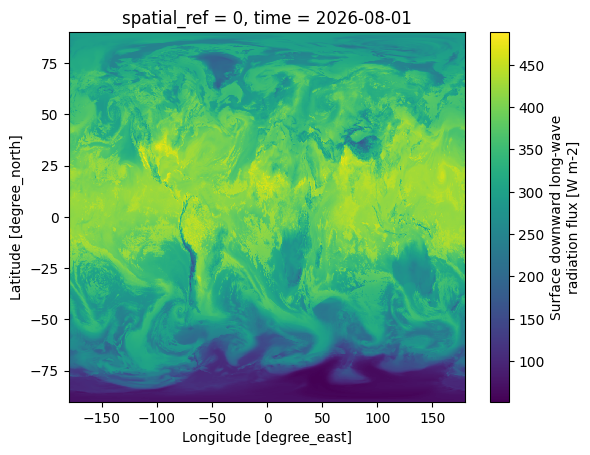

In [4]:
# Plot a global downward longwave radiation map
analysis["downward_long_wave_radiation_flux_surface"].sel(time="2026-08-01T00").plot()

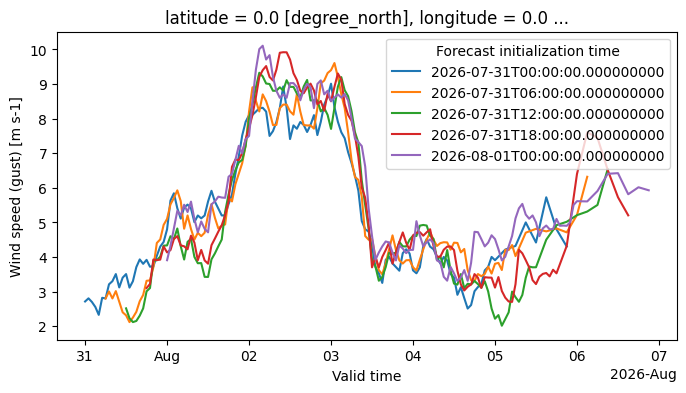

In [5]:
# Wind gust time-series at a point, from a handful of successive runs: later runs revise the earlier ones
(
    forecast["wind_gust_surface"]
    .sel(init_time=slice("2026-07-31T00", "2026-08-01T00"))
    .sel(lead_time=slice("0d", "5d"))
    .sel(latitude=0, longitude=0, method="nearest")
    .plot(x="valid_time", hue="init_time", size=4, aspect=2)
)

## What did the upper atmosphere look like during the January 2025 cold outbreak?

500 hPa geopotential height is the standard way to see the shape of the mid-troposphere: ridges where the surface is mild, troughs where cold air has pushed south. Look for the blue lobe reaching down over eastern North America: that is the cold air, pushed far south. These heights come from the `pressure_level` group, which carries 16 variables on 57 levels.

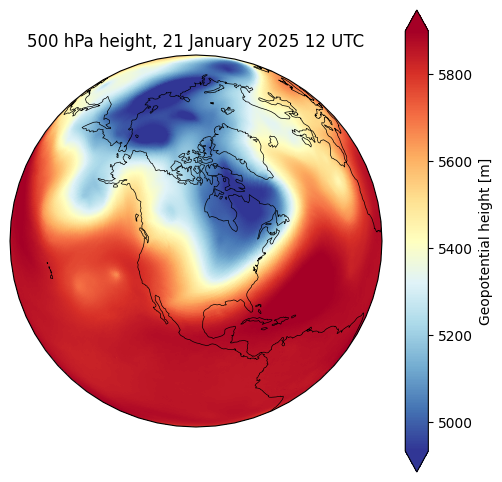

In [6]:
height_500 = analysis_pressure["geopotential_height"].sel(pressure_level=500, time="2025-01-21T12")

plot = height_500.plot(
    subplot_kws={"projection": ccrs.Orthographic(-100, 50)},
    transform=ccrs.PlateCarree(),
    cmap="RdYlBu_r", robust=True, center=False, size=6, aspect=1,
)
plot.axes.coastlines(linewidth=0.5)
plot.axes.set_global()
plot.axes.set_title("500 hPa height, 21 January 2025 12 UTC");

## How much did a 5-day forecast miss by?

To understand forecast error we can compare a forecast to the analysis at the same valid time. The analysis is the model's best estimate of what eventually happened. This is the 5-day forecast of 2 m temperature valid 1 August 2026, minus the analysis for that hour.

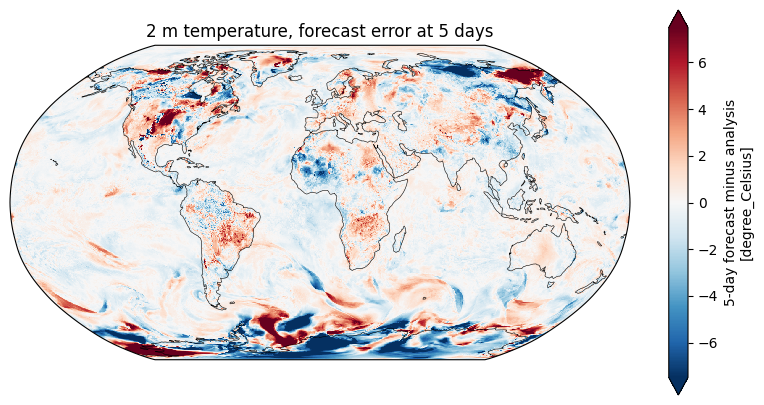

In [7]:
valid_time = np.datetime64("2026-08-01T00")
five_days = np.timedelta64(120, "h")

forecast_5day_temp = (
    forecast["temperature_2m"]
    .sel(init_time=valid_time - five_days, lead_time=five_days)
)
analysis_temp = analysis["temperature_2m"].sel(time=valid_time)

error = forecast_5day_temp - analysis_temp
error.attrs["long_name"] = "5-day forecast minus analysis"
error.attrs["units"] = analysis_temp.attrs["units"]

plot = error.plot.imshow(
    subplot_kws={"projection": ccrs.Robinson()},
    transform=ccrs.PlateCarree(),
    cmap="RdBu_r", robust=True, size=5, aspect=2,
)
plot.axes.coastlines(linewidth=0.4)
plot.axes.set_title("2 m temperature, forecast error at 5 days");

## Where was the moisture during the January 2023 California storms?

Precipitable water is the depth of water you would get by condensing a whole atmospheric column. The narrow plume reaching the west coast is an atmospheric river.

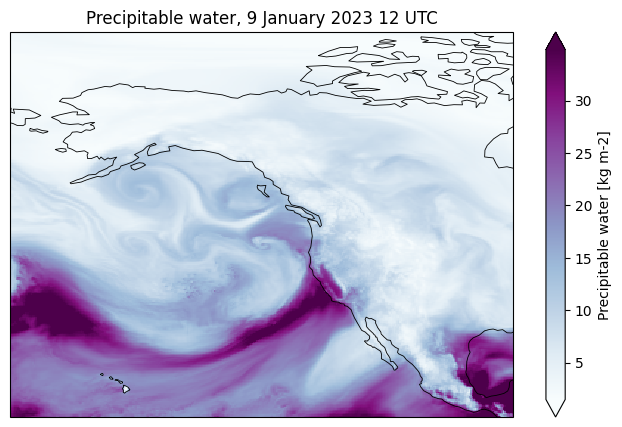

In [8]:
pwat = (
    analysis["precipitable_water_atmosphere"]
    .sel(time="2023-01-09T12")
    .sel(latitude=slice(80, 15), longitude=slice(-175, -90))
)
plot = pwat.plot(
    subplot_kws={"projection": ccrs.PlateCarree()},
    transform=ccrs.PlateCarree(),
    cmap="BuPu", robust=True, center=False, size=5, aspect=1.7,
)
plot.axes.coastlines(linewidth=0.6)
plot.axes.set_title("Precipitable water, 9 January 2023 12 UTC");

## Animation: The polar vortex reversing

A polar vortex begins this animation as the red ring of west-to-east winds circling the north pole. We read them from the 10 hPa pressure level, high in the stratosphere. About halfway through the vortex breaks down and is replaced with an east-to-west (blue) wind.

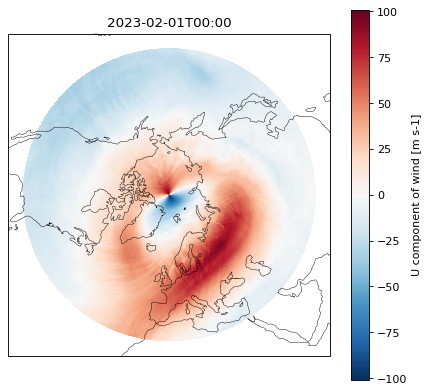

In [9]:
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

vortex = (
    analysis_pressure["wind_u"]
    .sel(pressure_level=10)
    .sel(time=slice("2023-02-01T00", "2023-02-25T00"))
    .sel(latitude=slice(90, 30))
    .isel(time=slice(None, None, 12)) # sample every 12 hours for speed/size
    .load()
)

fig, ax = plt.subplots(figsize=(6.5, 6), dpi=80, subplot_kw={"projection": ccrs.NorthPolarStereo()})
mesh = vortex.isel(time=0).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="RdBu_r", center=0)
ax.coastlines(linewidth=0.4)

def draw(i):
    mesh.set_array(vortex.isel(time=i).values.ravel())
    ax.set_title(str(vortex.time.values[i])[:16])

anim = FuncAnimation(fig, draw, frames=vortex.sizes["time"], interval=300)
HTML(anim.to_jshtml())

## Community challenge

- Which fields does the forecast get right first? Compare `wind_gust_surface`, `composite_reflectivity` and `convective_available_potential_energy_surface` at matching valid times across lead times for a season of storms.
- The `height_above_mean_sea_level` group carries temperature and wind at eight aviation heights from 305 m to 4572 m. Where and when does the analysis show sub-freezing air and strong low-level wind shear, and how far ahead does the forecast see them?
- Soil moisture and temperature are stored in four layers down to 2 m. How quickly do model soils dry out during a flash drought, and does the forecast anticipate it?